In [193]:
import pandas as pd
import datatable as dt
import numpy as np
from sklearn.preprocessing import MinMaxScaler,StandardScaler, RobustScaler
import plotly.express as px
from sklearn.model_selection import train_test_split
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression, Perceptron, SGDClassifier, LogisticRegression, PassiveAggressiveClassifier,RidgeClassifierCV
from sklearn.neural_network import MLPClassifier

In [38]:
#choose colors accordingly
pl1=px.colors.qualitative.swatches()
pl1.show()

In [26]:
print(px.colors.qualitative.Plotly)

['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']


In [7]:
sample_submission = pd.read_csv('../sample_submission.csv')
train = pd.read_csv('../compressed_train.csv')
test = pd.read_csv('../compressed_test.csv')

In [8]:
train=train.drop(columns='Unnamed: 0')
test=test.drop(columns='Unnamed: 0')

,f0,f1,f2,f3,f4,f5,f6,f7,f8,f9,...,f91,f92,f93,f94,f95,f96,f97,f98,f99,target
0,0.10660,3.594,132.80,3.1840,0.082000,1.188,3.73200,2.26600,2.100,0.012330,...,1.0990,0.01333,-0.01172,0.05276,0.065400,4.21000,1.979,0.08600,0.240500,False
1,0.12500,1.674,76.56,3.3790,0.099400,5.094,1.27500,-0.47140,4.547,0.037720,...,3.4600,0.01706,0.12490,0.15400,0.607000,-0.26780,2.578,-0.02087,0.024720,False
2,0.03632,1.497,233.50,2.1950,0.026920,3.127,5.06000,3.85000,1.802,0.057000,...,4.8830,0.08520,0.03240,0.11610,-0.001689,-0.52000,2.140,0.12445,0.148200,False
3,-0.01408,0.246,780.00,1.8910,0.006947,1.531,2.69700,4.51600,4.504,0.123500,...,3.4750,-0.01710,-0.00810,0.06200,0.041200,0.51170,1.969,0.04000,0.044860,False
4,-0.00326,3.715,156.10,2.1480,0.018280,2.098,4.15600,-0.03824,3.371,0.034180,...,1.9100,-0.04294,0.10560,0.12510,0.037500,1.04400,1.075,-0.01282,0.072800,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
599995,0.04300,1.641,1376.00,1.0870,0.839400,1.693,3.84400,1.10800,1.506,-0.022170,...,1.5530,0.08030,0.01764,0.22510,0.073200,4.43800,1.739,0.04904,0.065800,True
599996,0.13710,4.830,-99.60,0.9854,0.037720,3.303,2.47300,5.94000,0.875,-0.009735,...,1.3450,0.09247,0.08190,0.23400,0.041380,3.87300,1.870,0.16240,0.085630,False
599997,1.31600,0.502,66.25,2.2320,0.060030,3.773,2.65600,3.15600,1.055,0.025130,...,2.1820,0.03270,0.10970,0.02747,0.061920,-0.38330,0.922,0.08484,0.052640,False
599998,0.51170,3.828,778.00,0.2860,0.520000,2.764,2.52100,1.56200,1.971,0.462000,...,0.3667,0.07090,0.07150,-0.03810,0.038820,-0.12286,3.107,0.06134,0.004177,True


In [20]:
categorical_features=[]
numerical_features=[]
for i in test.columns:
    if test[i].dtype=='float64':
        numerical_features.append(i)
    elif i!='target':
        categorical_features.append(i)

print(f'Continious features obtained {len(numerical_features)} and categorical features obtained are {len(categorical_features)}')

Continious features obtained 100 and categorical features obtained are 0


In [41]:
#target distribution
pal=['#FFA15A','#00CC96']

fig = px.histogram(train, x="target", color="target", color_discrete_sequence=pal)
fig.show()



In [44]:
%%time
scale = RobustScaler()
scale = MinMaxScaler()
scale = StandardScaler()
train[cont_features]=scale.fit_transform(train[numerical_features])
test[cont_features]= scale.transform(test[numerical_features])  

print('Data scaled using : ', scale)

Data scaled using :  StandardScaler()
CPU times: user 1.38 s, sys: 220 ms, total: 1.6 s
Wall time: 1.6 s


In [48]:
train

,f0,f1,f2,f3,f4,f5,f6,f7,f8,f9,...,f91,f92,f93,f94,f95,f96,f97,f98,f99,target
0,-0.382636,0.705535,-0.315083,0.347098,-0.229588,-0.876038,0.660072,-0.197238,-0.285895,-0.289269,...,-0.872262,-0.258810,-0.595569,-0.199500,-0.196144,1.066556,-0.400736,-0.167086,0.443390,False
1,-0.347417,-0.529975,-0.417014,0.473350,-0.187910,1.623762,-0.910903,-1.964032,1.310337,-0.229088,...,0.658364,-0.252008,0.548392,0.019627,2.393661,-1.806729,-0.007972,-0.412094,-0.371196,False
2,-0.517156,-0.643873,-0.132570,-0.293229,-0.361520,0.364902,1.509179,0.825119,-0.480286,-0.183389,...,1.580890,-0.127755,-0.226138,-0.062405,-0.516948,-1.968559,-0.295168,-0.078936,0.094950,False
3,-0.613625,-1.448885,0.857927,-0.490053,-0.409361,-0.656521,-0.001694,1.254974,1.282287,-0.025766,...,0.668089,-0.314299,-0.565257,-0.179501,-0.311863,-1.306545,-0.407293,-0.272544,-0.295166,False
4,-0.592915,0.783398,-0.272853,-0.323659,-0.382215,-0.293647,0.931173,-1.684458,0.543207,-0.237478,...,-0.346494,-0.361419,0.386788,-0.042925,-0.329555,-0.964982,-0.993489,-0.393639,-0.189690,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
599995,-0.504370,-0.551210,1.938141,-1.010601,1.584599,-0.552843,0.731684,-0.944643,-0.673374,-0.371043,...,-0.577936,-0.136690,-0.349728,0.173518,-0.158846,1.212858,-0.558104,-0.251819,-0.216116,True
599996,-0.324257,1.500895,-0.736294,-1.076382,-0.335651,0.477540,-0.144917,2.174063,-1.084989,-0.341569,...,-0.712782,-0.114498,0.188340,0.192781,-0.311002,0.850312,-0.472207,0.008068,-0.141256,False
599997,1.932229,-1.284150,-0.435701,-0.269273,-0.282212,0.778335,-0.027909,0.377193,-0.967571,-0.258929,...,-0.170158,-0.223489,0.421118,-0.254239,-0.212785,-1.880842,-1.093811,-0.169745,-0.265796,False
599998,0.392750,0.856113,0.854302,-1.529208,0.819546,0.132586,-0.114226,-0.651619,-0.370044,0.776571,...,-1.347009,-0.153831,0.101258,-0.396160,-0.323243,-1.713725,0.338894,-0.223621,-0.448747,True


In [61]:
#lets train only on 20% data and identify what models perform better and then later can develop a piepline for the best performing model.
X=train.drop(['target'],axis=1)
y=train.target
X_train,X_valid,y_train,y_valid=train_test_split(X,y,train_size=0.1,test_size=0.05,random_state=2001)

In [62]:
print(len(X_train))

60000


In [154]:
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, accuracy_score, log_loss, roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.ensemble import (AdaBoostClassifier,BaggingClassifier,ExtraTreesClassifier,GradientBoostingClassifier,RandomForestClassifier,VotingClassifier)

In [110]:
def cnf_matrix_and_report(y_validation,y_prediction):
    cf_matrix = confusion_matrix(y_validation, y_prediction)
    sns_plot=sns.heatmap(cf_matrix, annot=True,  cmap='Blues')
    fig = sns_plot.get_figure()
    #fig.savefig("output.png")
    print(classification_report(y_validation, y_prediction))

In [138]:
accuracy_list=[]
model_list=[]

In [139]:
#BASIC MODELS FIRST

#1. KNN
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, log_loss, roc_auc_score
from sklearn.model_selection import cross_validate,cross_val_score,train_test_split, KFold, GridSearchCV
model_type='knn'
knn=KNeighborsClassifier()
knn.fit(X_train,y_train)
ypreds=knn.predict(X_valid)
accuracy=accuracy_score(ypreds,y_valid)
print(f'accuracy- {accuracy}')


accuracy- 0.5676666666666667


roc_auc_score is :0.5903574163668541
              precision    recall  f1-score   support

       False       0.56      0.58      0.57     14842
        True       0.57      0.55      0.56     15158

    accuracy                           0.57     30000
   macro avg       0.57      0.57      0.57     30000
weighted avg       0.57      0.57      0.57     30000



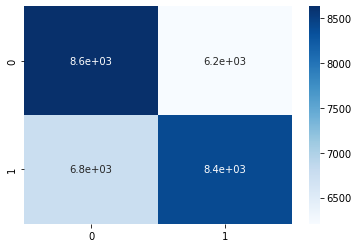

In [140]:
y_scores = knn.predict_proba(X_valid)
fpr, tpr, threshold = roc_curve(y_valid, y_scores[:, 1])
roc_auc = auc(fpr, tpr)
print(f'roc_auc_score is :{roc_auc}')
cnf_matrix_and_report(y_valid,ypreds)
accuracy_list.append(accuracy)
model_list.append(model_type)

/home/adw/work_files/envs/ml_env/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



accuracy- 0.7264333333333334
              precision    recall  f1-score   support

       False       0.73      0.72      0.72     14842
        True       0.73      0.73      0.73     15158

    accuracy                           0.73     30000
   macro avg       0.73      0.73      0.73     30000
weighted avg       0.73      0.73      0.73     30000



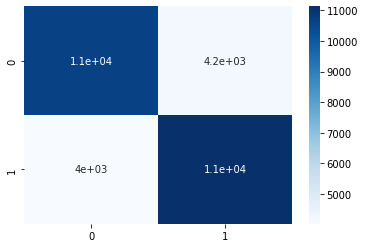

In [142]:
#2. Linear SVC
from sklearn.svm import SVC, LinearSVC
model_type='Linear_svc'
linear_svc=LinearSVC()
linear_svc.fit(X_train,y_train)
ypreds=linear_svc.predict(X_valid)
accuracy=accuracy_score(ypreds,y_valid)
print(f'accuracy- {accuracy}')
cnf_matrix_and_report(y_valid,ypreds)
accuracy_list.append(accuracy)
model_list.append(model_type)

In [145]:
svc_auc_roc_score=roc_auc_score(y_valid, ypreds)
print(f'Linear SVC auc roc score is {svc_auc_roc_score}')

Linear SVC auc roc score is 0.7263513583791582


accuracy- 0.7282333333333333
              precision    recall  f1-score   support

       False       0.73      0.72      0.72     14842
        True       0.73      0.74      0.73     15158

    accuracy                           0.73     30000
   macro avg       0.73      0.73      0.73     30000
weighted avg       0.73      0.73      0.73     30000

Logistic regression auc roc score is 0.7281571765144644


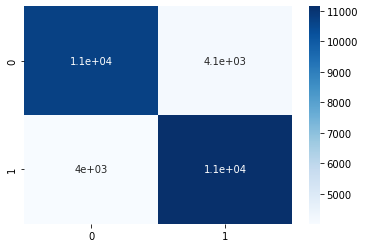

In [146]:
#2. Logisitc Regression
from sklearn.linear_model import LogisticRegression
model_type='LogisticRegression'
lr=LogisticRegression()
lr.fit(X_train,y_train)
ypreds=lr.predict(X_valid)
accuracy=accuracy_score(ypreds,y_valid)
print(f'accuracy- {accuracy}')
cnf_matrix_and_report(y_valid,ypreds)
accuracy_list.append(accuracy)
model_list.append(model_type)
lr_auc=roc_auc_score(y_valid, ypreds)
print(f'Logistic regression auc roc score is {lr_auc}')

accuracy- 0.5448333333333333
              precision    recall  f1-score   support

       False       0.54      0.54      0.54     14842
        True       0.55      0.55      0.55     15158

    accuracy                           0.54     30000
   macro avg       0.54      0.54      0.54     30000
weighted avg       0.54      0.54      0.54     30000

 auc roc score is 0.5448119719380777


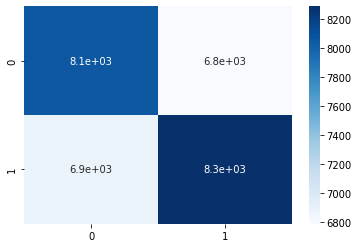

In [153]:
#3 Decision Tree
from sklearn.tree import DecisionTreeClassifier
model_type='DecisionTreeClassifier'
dt=DecisionTreeClassifier()
dt.fit(X_train,y_train)
ypreds=dt.predict(X_valid)
accuracy=accuracy_score(ypreds,y_valid)
print(f'accuracy- {accuracy}')
cnf_matrix_and_report(y_valid,ypreds)
accuracy_list.append(accuracy)
model_list.append(model_type)
lr_auc=roc_auc_score(y_valid, ypreds)
print(f' auc roc score is {lr_auc}')

accuracy- 0.6555666666666666
              precision    recall  f1-score   support

       False       0.65      0.66      0.65     14842
        True       0.66      0.65      0.66     15158

    accuracy                           0.66     30000
   macro avg       0.66      0.66      0.66     30000
weighted avg       0.66      0.66      0.66     30000

 auc roc score is 0.655608158231387


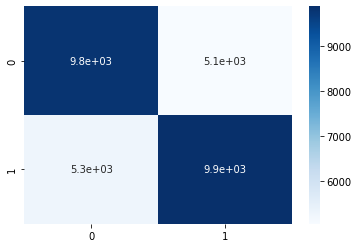

In [156]:
#4 Random Forest

model_type='RandomForestClassifier'
clf=RandomForestClassifier()
clf.fit(X_train,y_train)
ypreds=clf.predict(X_valid)
accuracy=accuracy_score(ypreds,y_valid)
print(f'accuracy- {accuracy}')
cnf_matrix_and_report(y_valid,ypreds)
accuracy_list.append(accuracy)
model_list.append(model_type)
lr_auc=roc_auc_score(y_valid, ypreds)
print(f' auc roc score is {lr_auc}')

accuracy- 0.6617333333333333
              precision    recall  f1-score   support

       False       0.66      0.65      0.66     14842
        True       0.66      0.67      0.67     15158

    accuracy                           0.66     30000
   macro avg       0.66      0.66      0.66     30000
weighted avg       0.66      0.66      0.66     30000

 auc roc score is 0.661628377292492


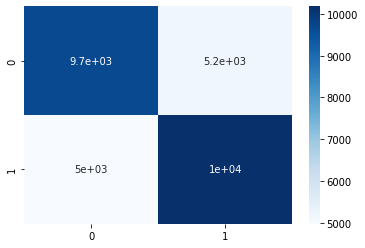

In [157]:
#5 AdaBoostClassifier

model_type='AdaBoostClassifier'
adb=AdaBoostClassifier()
adb.fit(X_train,y_train)
ypreds=adb.predict(X_valid)
accuracy=accuracy_score(ypreds,y_valid)
print(f'accuracy- {accuracy}')
cnf_matrix_and_report(y_valid,ypreds)
accuracy_list.append(accuracy)
model_list.append(model_type)
lr_auc=roc_auc_score(y_valid, ypreds)
print(f' auc roc score is {lr_auc}')

accuracy- 0.5857333333333333
              precision    recall  f1-score   support

       False       0.57      0.68      0.62     14842
        True       0.61      0.50      0.55     15158

    accuracy                           0.59     30000
   macro avg       0.59      0.59      0.58     30000
weighted avg       0.59      0.59      0.58     30000

 auc roc score is 0.5866762034877505


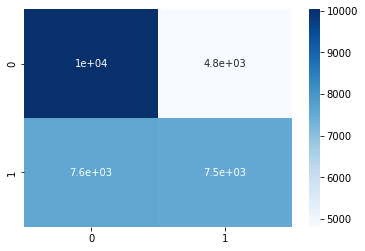

In [158]:
#6 AdaBoostClassifier

model_type='BaggingClassifier'
bagging=BaggingClassifier()
bagging.fit(X_train,y_train)
ypreds=bagging.predict(X_valid)
accuracy=accuracy_score(ypreds,y_valid)
print(f'accuracy- {accuracy}')
cnf_matrix_and_report(y_valid,ypreds)
accuracy_list.append(accuracy)
model_list.append(model_type)
lr_auc=roc_auc_score(y_valid, ypreds)
print(f' auc roc score is {lr_auc}')

accuracy- 0.6536333333333333
              precision    recall  f1-score   support

       False       0.65      0.66      0.65     14842
        True       0.66      0.65      0.65     15158

    accuracy                           0.65     30000
   macro avg       0.65      0.65      0.65     30000
weighted avg       0.65      0.65      0.65     30000

 auc roc score is 0.6536774195693427


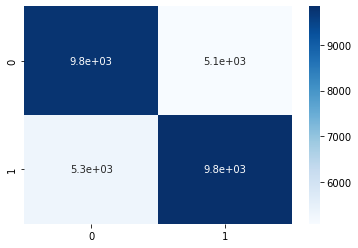

In [159]:
#7 ExtraTreesClassifier
model_type='ExtraTreesClassifier'
etc=ExtraTreesClassifier()
etc.fit(X_train,y_train)
ypreds=etc.predict(X_valid)
accuracy=accuracy_score(ypreds,y_valid)
print(f'accuracy- {accuracy}')
cnf_matrix_and_report(y_valid,ypreds)
accuracy_list.append(accuracy)
model_list.append(model_type)
lr_auc=roc_auc_score(y_valid, ypreds)
print(f' auc roc score is {lr_auc}')

accuracy- 0.6709333333333334
              precision    recall  f1-score   support

       False       0.67      0.65      0.66     14842
        True       0.67      0.69      0.68     15158

    accuracy                           0.67     30000
   macro avg       0.67      0.67      0.67     30000
weighted avg       0.67      0.67      0.67     30000

 auc roc score is 0.6707668934432353


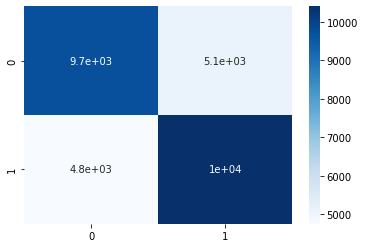

In [160]:
#8 GradientBoostingClassifier
model_type='GradientBoostingClassifier'
gbc=GradientBoostingClassifier()
gbc.fit(X_train,y_train)
ypreds=gbc.predict(X_valid)
accuracy=accuracy_score(ypreds,y_valid)
print(f'accuracy- {accuracy}')
cnf_matrix_and_report(y_valid,ypreds)
accuracy_list.append(accuracy)
model_list.append(model_type)
lr_auc=roc_auc_score(y_valid, ypreds)
print(f' auc roc score is {lr_auc}')

accuracy- 0.6813666666666667
              precision    recall  f1-score   support

       False       0.68      0.67      0.68     14842
        True       0.68      0.69      0.69     15158

    accuracy                           0.68     30000
   macro avg       0.68      0.68      0.68     30000
weighted avg       0.68      0.68      0.68     30000

 auc roc score is 0.6812621334573317


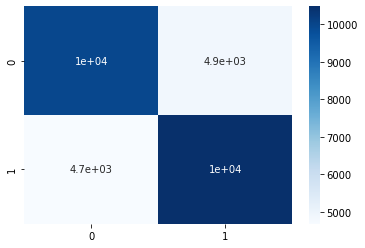

In [171]:
#9 LGBMClassifier
model_type='LGBMClassifier'
lgbm=LGBMClassifier()
lgbm.fit(X_train,y_train)
ypreds=lgbm.predict(X_valid)
accuracy=accuracy_score(ypreds,y_valid)
print(f'accuracy- {accuracy}')
cnf_matrix_and_report(y_valid,ypreds)
accuracy_list.append(accuracy)
model_list.append(model_type)
lr_auc=roc_auc_score(y_valid, ypreds)
print(f' auc roc score is {lr_auc}')

/home/adw/work_files/envs/ml_env/lib/python3.7/site-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[05:47:59] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
accuracy- 0.6605
              precision    recall  f1-score   support

       False       0.66      0.66      0.66     14842
        True       0.66      0.67      0.66     15158

    accuracy                           0.66     30000
   macro avg       0.66      0.66      0.66     30000
weighted avg       0.66      0.66      0.66     30000

 auc roc score is 0.6604507399656556


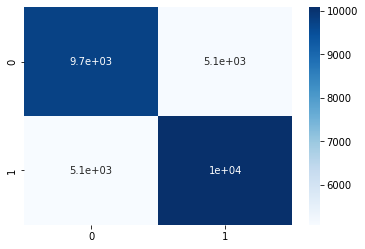

In [172]:
#10 XGBClassifier
model_type='XGBClassifier'
xgb=XGBClassifier()
xgb.fit(X_train,y_train)
ypreds=xgb.predict(X_valid)
accuracy=accuracy_score(ypreds,y_valid)
print(f'accuracy- {accuracy}')
cnf_matrix_and_report(y_valid,ypreds)
accuracy_list.append(accuracy)
model_list.append(model_type)
lr_auc=roc_auc_score(y_valid, ypreds)
print(f' auc roc score is {lr_auc}')

accuracy- 0.6734
              precision    recall  f1-score   support

       False       0.67      0.66      0.67     14842
        True       0.67      0.68      0.68     15158

    accuracy                           0.67     30000
   macro avg       0.67      0.67      0.67     30000
weighted avg       0.67      0.67      0.67     30000

 auc roc score is 0.6733019569335685


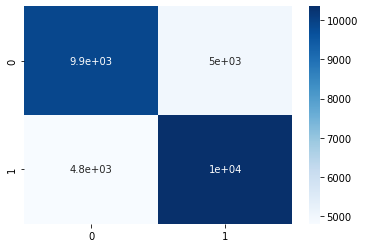

In [188]:
#11 SGDClassifier
model_type='SGDClassifier'
sgd=SGDClassifier()
sgd.fit(X_train,y_train)
ypreds=sgd.predict(X_valid)
accuracy=accuracy_score(ypreds,y_valid)
print(f'accuracy- {accuracy}')
cnf_matrix_and_report(y_valid,ypreds)
accuracy_list.append(accuracy)
model_list.append(model_type)
lr_auc=roc_auc_score(y_valid, ypreds)
print(f' auc roc score is {lr_auc}')

accuracy- 0.7287666666666667
              precision    recall  f1-score   support

       False       0.73      0.72      0.72     14842
        True       0.73      0.74      0.73     15158

    accuracy                           0.73     30000
   macro avg       0.73      0.73      0.73     30000
weighted avg       0.73      0.73      0.73     30000

 auc roc score is 0.7286870575275738


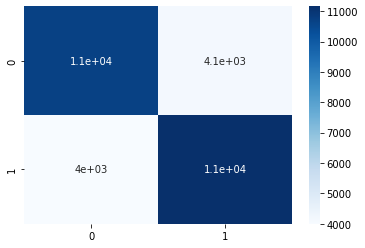

In [189]:
#12 Ridge Classifier
model_type='Ridge Classifier'
rgc=RidgeClassifierCV()
rgc.fit(X_train,y_train)
ypreds=rgc.predict(X_valid)
accuracy=accuracy_score(ypreds,y_valid)
print(f'accuracy- {accuracy}')
cnf_matrix_and_report(y_valid,ypreds)
accuracy_list.append(accuracy)
model_list.append(model_type)
lr_auc=roc_auc_score(y_valid, ypreds)
print(f' auc roc score is {lr_auc}')

accuracy- 0.5873666666666667
              precision    recall  f1-score   support

       False       0.58      0.58      0.58     14842
        True       0.59      0.60      0.59     15158

    accuracy                           0.59     30000
   macro avg       0.59      0.59      0.59     30000
weighted avg       0.59      0.59      0.59     30000

 auc roc score is 0.5872636419980393


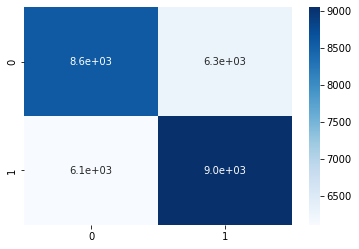

In [190]:
#13 Perceptron
model_type='Perceptron'
percp=Perceptron()
percp.fit(X_train,y_train)
ypreds=percp.predict(X_valid)
accuracy=accuracy_score(ypreds,y_valid)
print(f'accuracy- {accuracy}')
cnf_matrix_and_report(y_valid,ypreds)
accuracy_list.append(accuracy)
model_list.append(model_type)
lr_auc=roc_auc_score(y_valid, ypreds)
print(f' auc roc score is {lr_auc}')

accuracy- 0.5570666666666667
              precision    recall  f1-score   support

       False       0.56      0.52      0.54     14842
        True       0.56      0.60      0.58     15158

    accuracy                           0.56     30000
   macro avg       0.56      0.56      0.56     30000
weighted avg       0.56      0.56      0.56     30000

 auc roc score is 0.5566424889915341


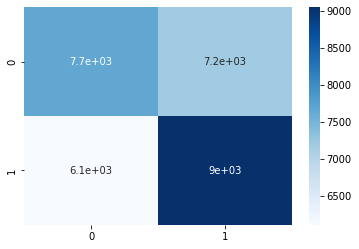

In [191]:
#14 passive aggresive
model_type='Passive Aggresive'
pac=PassiveAggressiveClassifier()
pac.fit(X_train,y_train)
ypreds=pac.predict(X_valid)
accuracy=accuracy_score(ypreds,y_valid)
print(f'accuracy- {accuracy}')
cnf_matrix_and_report(y_valid,ypreds)
accuracy_list.append(accuracy)
model_list.append(model_type)
lr_auc=roc_auc_score(y_valid, ypreds)
print(f' auc roc score is {lr_auc}')

/home/adw/work_files/envs/ml_env/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



accuracy- 0.6491333333333333
              precision    recall  f1-score   support

       False       0.65      0.64      0.64     14842
        True       0.65      0.66      0.66     15158

    accuracy                           0.65     30000
   macro avg       0.65      0.65      0.65     30000
weighted avg       0.65      0.65      0.65     30000

 auc roc score is 0.6490038032486413


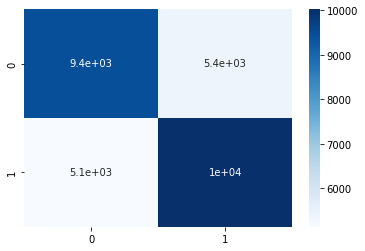

In [194]:
#15 MLP sklearn
model_type='MLP'
mlp=MLPClassifier()
mlp.fit(X_train,y_train)
ypreds=mlp.predict(X_valid)
accuracy=accuracy_score(ypreds,y_valid)
print(f'accuracy- {accuracy}')
cnf_matrix_and_report(y_valid,ypreds)
accuracy_list.append(accuracy)
model_list.append(model_type)
lr_auc=roc_auc_score(y_valid, ypreds)
print(f' auc roc score is {lr_auc}')

In [205]:
list_of_tuples = list(zip(model_list, accuracy_list))
df = pd.DataFrame(list_of_tuples, columns = ['Models', 'scores'])
df=df.sort_values(by='scores', ascending=False)
df=df.reset_index(drop=True)

In [217]:
fig = px.bar(df, x='Models', y='scores',color_discrete_sequence=px.colors.qualitative.Pastel)
fig.show()

## Observations
**15 models fitted.**
We can see that gradient boosting models have showed accuracy in the similiar range of 0.65 -0.68 while Ridge,LR and Linear SVC has performed much better.

The cluster was of 3 groups .72 range .68 range and .56-.55 range

The next step for model training can be finetuning the hyperparams for top 5-8 models on a single fold and then further full training on 10 fold dataset.

Further more the next step should be get the feature importance of this dataset, we might use a few tecniques to get the important features and then maybe 




### Feature Importance Analysis

<AxesSubplot:>

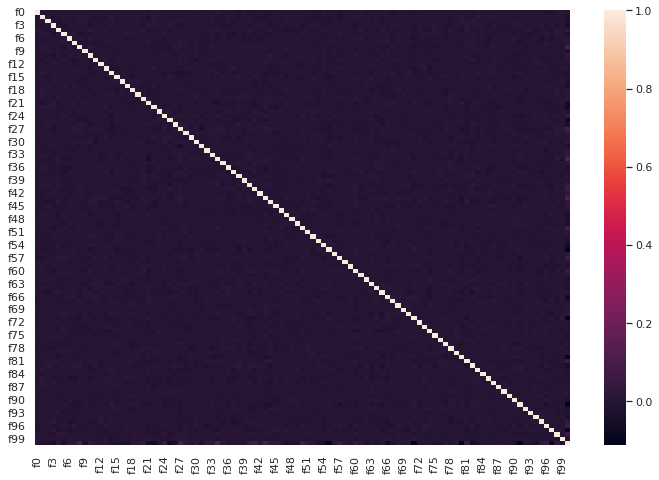

In [219]:
sns.set(rc = {'figure.figsize':(12,8)})
sns.heatmap(train.corr())

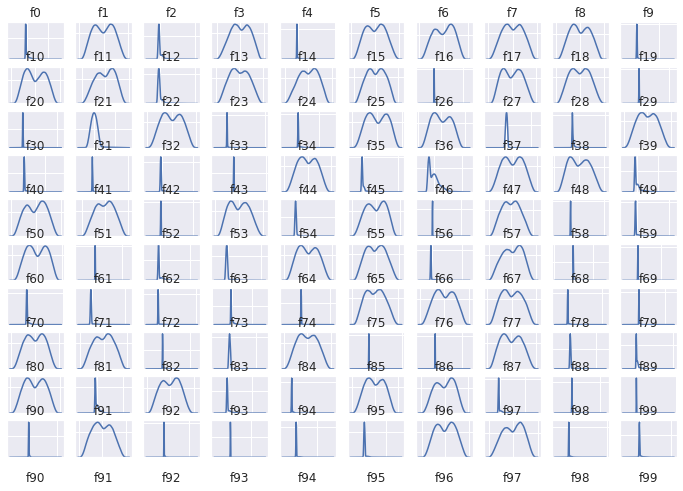

In [221]:
columns = 10
rows = 10
f=0
fig, ax_array = plt.subplots(rows, columns, squeeze=False)
for i,ax_row in enumerate(ax_array):
    for j,axes in enumerate(ax_row):
        axes.set_title('f'+str(f))
        col = 'f'+str(f)
        sns.set(rc = {'figure.figsize':(14,14)})
        g2 = sns.kdeplot(train[col],ax=axes)
        g2.set(ylabel=None)
        g2.set(xticklabels=[])
        g2.set(yticklabels=[])
        f=f+1
plt.show()

In [249]:
##SELECTING K BEST FEATURES 'LETS GET 45'
from sklearn.feature_selection import f_classif,mutual_info_classif,SelectKBest,chi2, SelectFromModel
import itertools
X=train.drop(['target'],axis=1)
y=train['target']
selection=SelectKBest(score_func=f_classif,k=45)
selection.fit(X,y)
mask=selection.get_support()
new_features = [] 
for bool,feature in zip(mask,X.columns):
    if bool:
        new_features.append(feature)

In [258]:
absoulte_corr = pd.DataFrame(np.abs(train).corr()['target'])


In [260]:
absoulte_corr=absoulte_corr.sort_values(by='target', ascending=False)

In [267]:
top45_absolute=absoulte_corr.head(45).index.tolist()